# Lab 10 - Vanilla CNN and Fine-Tune VGG16 - for Dogs and Cats Classification

#### <mark>Goal :</mark> In this lab, we'll follow a common practice among Deep Learning Engineers: taking an existing model that performs a similar task to what the engineer wants to achieve and fine-tuning it for the specific task at hand.

# loading Necessary Modules

In [31]:
import os
import math
import shutil
import warnings
import pathlib

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Activation, MaxPool2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model

from sklearn.metrics import confusion_matrix, precision_recall_curve, classification_report
from sklearn.model_selection import train_test_split
from sklearn.exceptions import UndefinedMetricWarning


# Loading Dataset

In [2]:

original_dir = pathlib.Path("E:/courses_conestoga/CSCN8010-labs/data/train")
data_folder = pathlib.Path("../CSCN8010-labs/data/kaggle_dogs_vs_cats_small")

def make_subset(subset_name, start_index, end_index):
    for category in ("cat", "dog"):
        dir = data_folder / subset_name / category
        os.makedirs(dir, exist_ok=True)  # Use exist_ok=True to avoid FileExistsError
        fnames = [f"{category}.{i}.jpg" for i in range(start_index, end_index)]
        for fname in fnames:
            shutil.copyfile(src=original_dir / fname,
                            dst=dir / fname)

make_subset("train", start_index=0, end_index=1000)
make_subset("validation", start_index=1000, end_index=1500)
make_subset("test", start_index=1500, end_index=2500)

# Images represent in orignal dataset

###  <font color='red'>9 - Images for Cat
###  <font color='magenta'>9 - Images for Dog

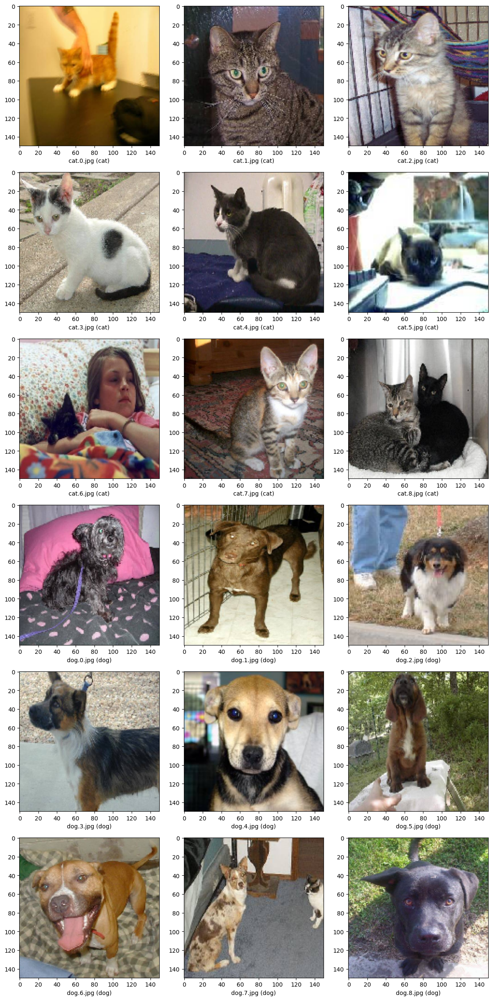

In [3]:

# Define the original directory containing the training images
original_dir = pathlib.Path("E:/courses_conestoga/CSCN8010-labs/data/train")

# Define the number of sample images you want to plot
num_samples = 18

# Plotting sample images
plt.figure(figsize=(12, 24))
for index in range(num_samples):
    category = "cat" if index < num_samples // 2 else "dog"
    image_index = index if category == "cat" else index - num_samples // 2
    filename = f"{category}.{image_index}.jpg"
    img_path = original_dir / filename
    img = load_img(img_path, target_size=(150, 150))  # Adjust target_size as needed
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + ' (' + category + ')' )
plt.tight_layout()
plt.show()

# Labeling for Cat and Dogs

In [4]:
data_folder = pathlib.Path("../CSCN8010-labs/data/kaggle_dogs_vs_cats_small")
train_dir = data_folder / "train"
filenames = os.listdir(train_dir)
labels = [str(x)[:3] for x in filenames]
train_df = pd.DataFrame({'filename': filenames, 'label': labels})
train_df.head()

,filename,label
0,cat,cat
1,dog,dog


# Plotting : Data Subset Distribution

In [32]:

subset_names = ["train", "validation", "test"]
categories = ["cat", "dog"]
counts = []

for subset_name in subset_names:
    subset_counts = []
    for category in categories:
        subset_dir = data_folder / subset_name / category
        count = len(os.listdir(subset_dir))
        subset_counts.append(count)
    counts.append(subset_counts)

# Create traces for each category
traces = []
for i, category in enumerate(categories):
    trace = go.Bar(
        x=subset_names,
        y=[count[i] for count in counts],
        name=category
    )
    traces.append(trace)

# Layout
layout = go.Layout(
    title='Distribution of Data Subset',
    xaxis=dict(title='Subset'),
    yaxis=dict(title='Number of Files'),
    barmode='group'
)

# Create figure
fig = go.Figure(data=traces, layout=layout)

# Show plot
fig.show()


* The training subset has an equal number of cat and dog images (2000).
* The validation subset has twice as many dog images (500) compared to cat images (500).
* The testing subset is balanced with an equal number of cat and dog images (2000).

# Visualising Cat and Dog Images in Sub-Dataset

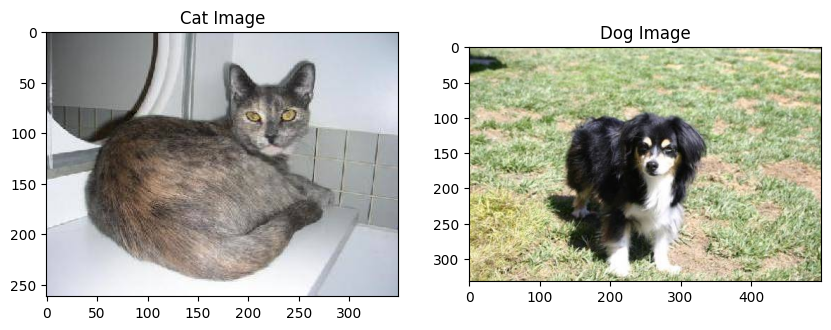

In [6]:
from PIL import Image

# Define the path to the train directory
data_folder = pathlib.Path("E:/courses_conestoga/CSCN8010-labs/data/kaggle_dogs_vs_cats_small")

# Define paths to cat and dog images
cat_img_path = data_folder / "train" / "cat" / "cat.30.jpg"
dog_img_path = data_folder / "train" / "dog" / "dog.20.jpg"

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot cat image
cat_img = Image.open(cat_img_path)
axes[0].imshow(cat_img)
axes[0].set_title('Cat Image')

# Plot dog image
dog_img = Image.open(dog_img_path)
axes[1].imshow(dog_img)
axes[1].set_title('Dog Image')

# Show the plot
plt.show()


# Counting Cats and Dogs Images in training subdataset 

In [33]:

# Define the path to the train directory
train_dir = pathlib.Path("E:/courses_conestoga/CSCN8010-labs/data/kaggle_dogs_vs_cats_small/train")

# Count the number of 'cat' and 'dog' images
cat_count = len(os.listdir(train_dir / "cat"))
dog_count = len(os.listdir(train_dir / "dog"))

# Create a pie chart using Plotly
fig = go.Figure(data=[go.Pie(labels=['cat', 'dog'], values=[cat_count, dog_count])])
fig.update_layout(title_text="Count of Cat and Dog Images")

# Show the plot
fig.show()


* <mark>cats and Dogs Data are divided equally to train model perfectly not biased with prediction

# Number of files present in Train, Validation and Test Dataset for Models

In [8]:

train_dataset = image_dataset_from_directory(
    data_folder / "train",
    image_size=(180, 180),
    batch_size=32)
validation_dataset = image_dataset_from_directory(
    data_folder / "validation",
    image_size=(180, 180),
    batch_size=32)
test_dataset = image_dataset_from_directory(
    data_folder / "test",
    image_size=(180, 180),
    batch_size=32)

Found 2000 files belonging to 2 classes.
Found 1100 files belonging to 2 classes.
Found 2200 files belonging to 2 classes.


# Defining Model-1 (custom Vanila Model)

In [9]:
inputs = keras.Input(shape=(180, 180, 3))
x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.Flatten()(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs=inputs, outputs=outputs)

In [10]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 43, 43, 64)       0         
 2D)                                                         

In [11]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [12]:

class CustomCallback(keras.callbacks.Callback):
    def __init__(self):
        super(CustomCallback, self).__init__()
        self.best_val_accuracy = 0.0
        self.best_epoch = 0

    def on_epoch_end(self, epoch, logs=None):
        val_accuracy = logs.get('val_accuracy')
        if val_accuracy is not None and val_accuracy > self.best_val_accuracy:
            self.best_val_accuracy = val_accuracy
            self.best_epoch = epoch + 1

# Create a custom callback instance
custom_callback = CustomCallback()

# Create ModelCheckpoint callback
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath="./models/convnet_from_scratch.keras",
    save_best_only=True,
    monitor="val_loss"
)

# Train the model with custom and ModelCheckpoint callbacks
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=[custom_callback, model_checkpoint_callback]
)

# Print the epoch with the highest validation accuracy
print("Epoch with the highest validation accuracy:", custom_callback.best_epoch)


Epoch 1/30
63/63 [==============================] - 84s 1s/step - loss: 0.7038 - accuracy: 0.5130 - val_loss: 0.6917 - val_accuracy: 0.5000
Epoch 2/30
63/63 [==============================] - 71s 1s/step - loss: 0.6922 - accuracy: 0.5255 - val_loss: 0.6848 - val_accuracy: 0.6327
Epoch 3/30
63/63 [==============================] - 69s 1s/step - loss: 0.6806 - accuracy: 0.5935 - val_loss: 0.6436 - val_accuracy: 0.6273
Epoch 4/30
63/63 [==============================] - 66s 1s/step - loss: 0.6491 - accuracy: 0.6235 - val_loss: 0.6390 - val_accuracy: 0.6500
Epoch 5/30
63/63 [==============================] - 69s 1s/step - loss: 0.6015 - accuracy: 0.6740 - val_loss: 0.6262 - val_accuracy: 0.6282
Epoch 6/30
63/63 [==============================] - 77s 1s/step - loss: 0.5744 - accuracy: 0.6995 - val_loss: 0.6362 - val_accuracy: 0.6336
Epoch 7/30
63/63 [==============================] - 73s 1s/step - loss: 0.5399 - accuracy: 0.7210 - val_loss: 0.7805 - val_accuracy: 0.6473
Epoch 8/30
63/63 [==

# **Displaying curves of loss and accuracy during training**

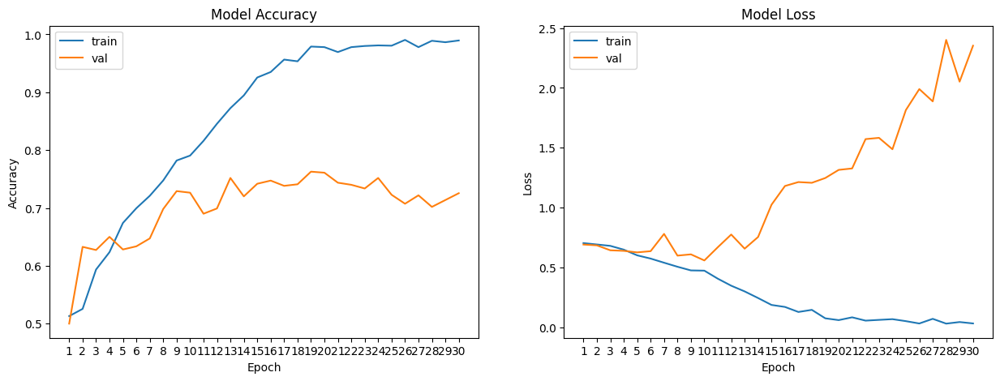

In [13]:

def plot_model_history(model_history, acc='accuracy', val_acc='val_accuracy'):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].plot(range(1, len(model_history.history[acc]) + 1), model_history.history[acc])
    axs[0].plot(range(1, len(model_history.history[val_acc]) + 1), model_history.history[val_acc])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1, len(model_history.history[acc]) + 1))
    axs[0].legend(['train', 'val'], loc='best')
    
    axs[1].plot(range(1, len(model_history.history['loss']) + 1), model_history.history['loss'])
    axs[1].plot(range(1, len(model_history.history['val_loss']) + 1), model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1, len(model_history.history['loss']) + 1))
    axs[1].legend(['train', 'val'], loc='best')
    
    plt.show()

plot_model_history(history)


Validation Accuracy:

<mark>Model 1: Achieved its highest validation accuracy of approximately 72.55% at epoch 19. After that model starts overfitting


# Model -2 (vgg16)

In [14]:
conv_base  = keras.applications.vgg16.VGG16(
    weights="imagenet",
    include_top=False)

In [15]:
conv_base.trainable = False
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [16]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.2),
    ]
)

inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = keras.applications.vgg16.preprocess_input(x)
x = conv_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)

In [17]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 180, 180, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 180, 180, 3)      0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 flatten_1 (Flatten)         (None, 12800)             0         
                                                           

In [18]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [19]:

# Define custom callback
class CustomCallback(callbacks.Callback):
    def __init__(self):
        super(CustomCallback, self).__init__()
        self.best_val_accuracy = 0.0
        self.best_epoch = 0

    def on_epoch_end(self, epoch, logs=None):
        val_accuracy = logs.get('val_accuracy')
        if val_accuracy is not None and val_accuracy > self.best_val_accuracy:
            self.best_val_accuracy = val_accuracy
            self.best_epoch = epoch + 1

# Create a custom callback instance
custom_callback = CustomCallback()

# Create ModelCheckpoint callback
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./models/vgg16_best_epoch.keras",
    save_best_only=True,
    monitor="val_loss"
)

# Train the model with custom and ModelCheckpoint callbacks
history = model.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=[custom_callback, model_checkpoint_callback]
)

# Print the epoch with the highest validation accuracy
print("Epoch with the highest validation accuracy:", custom_callback.best_epoch)

Epoch 1/50
63/63 [==============================] - 429s 7s/step - loss: 18.9898 - accuracy: 0.8930 - val_loss: 10.5139 - val_accuracy: 0.9427
Epoch 2/50
63/63 [==============================] - 428s 7s/step - loss: 8.7238 - accuracy: 0.9480 - val_loss: 5.6730 - val_accuracy: 0.9700
Epoch 3/50
63/63 [==============================] - 414s 7s/step - loss: 6.4355 - accuracy: 0.9595 - val_loss: 3.0872 - val_accuracy: 0.9791
Epoch 4/50
63/63 [==============================] - 405s 6s/step - loss: 5.8012 - accuracy: 0.9640 - val_loss: 3.3771 - val_accuracy: 0.9782
Epoch 5/50
63/63 [==============================] - 472s 8s/step - loss: 4.4299 - accuracy: 0.9645 - val_loss: 5.0346 - val_accuracy: 0.9755
Epoch 6/50
63/63 [==============================] - 437s 7s/step - loss: 4.4837 - accuracy: 0.9640 - val_loss: 3.7309 - val_accuracy: 0.9736
Epoch 7/50
63/63 [==============================] - 448s 7s/step - loss: 3.9992 - accuracy: 0.9690 - val_loss: 3.9567 - val_accuracy: 0.9736
Epoch 8/50


# **Displaying curves of loss and accuracy during training**

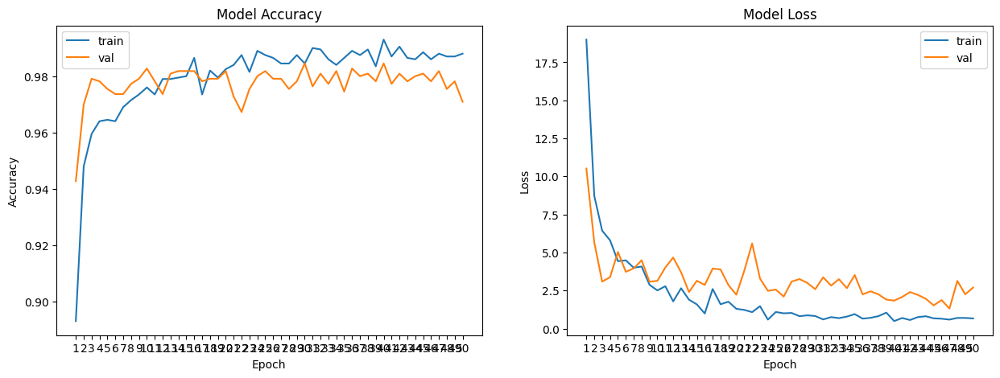

In [21]:

def plot_model_history(model_history, acc='accuracy', val_acc='val_accuracy'):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].plot(range(1, len(model_history.history[acc]) + 1), model_history.history[acc])
    axs[0].plot(range(1, len(model_history.history[val_acc]) + 1), model_history.history[val_acc])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1, len(model_history.history[acc]) + 1))
    axs[0].legend(['train', 'val'], loc='best')
    
    axs[1].plot(range(1, len(model_history.history['loss']) + 1), model_history.history['loss'])
    axs[1].plot(range(1, len(model_history.history['val_loss']) + 1), model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1, len(model_history.history['loss']) + 1))
    axs[1].legend(['train', 'val'], loc='best')
    
    plt.show()

plot_model_history(history)


Validation Accuracy:

<mark>Model 2: Achieved its highest validation accuracy of approximately 98.27% at epoch 30. After that model starts over fitting

# Comparaing relative performance of the models: 

1. **accuracy**
2. **confusion metric**
3. **precision, recall, F1-score**
4. **precision-recall curve**

Found 2200 images belonging to 2 classes.
Model 1 Evaluation:
Test Loss: 3.610851526260376
Test Accuracy: 0.5

Model 2 Evaluation:
Test Loss: 6.19694709777832
Test Accuracy: 0.5
69/69 [==============================] - 277s 4s/step


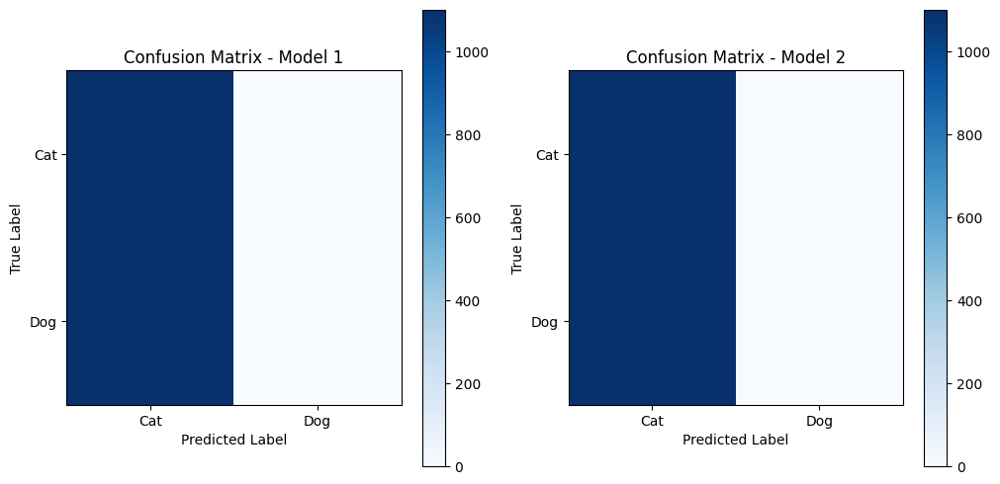


Model 1 Classification Report:
              precision    recall  f1-score   support

         Cat       0.50      1.00      0.67      1100
         Dog       0.00      0.00      0.00      1100

    accuracy                           0.50      2200
   macro avg       0.25      0.50      0.33      2200
weighted avg       0.25      0.50      0.33      2200


Model 2 Classification Report:
              precision    recall  f1-score   support

         Cat       0.50      1.00      0.67      1100
         Dog       0.00      0.00      0.00      1100

    accuracy                           0.50      2200
   macro avg       0.25      0.50      0.33      2200
weighted avg       0.25      0.50      0.33      2200



e:\courses_conestoga\CSCN8010-Course\CSCN8010\venv\tensorflow_cpu\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

e:\courses_conestoga\CSCN8010-Course\CSCN8010\venv\tensorflow_cpu\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

e:\courses_conestoga\CSCN8010-Course\CSCN8010\venv\tensorflow_cpu\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

e:\courses_conestoga\CSCN8010-Course\CSCN8010\venv\tensorflow_cpu\Lib\site-packages\sklearn

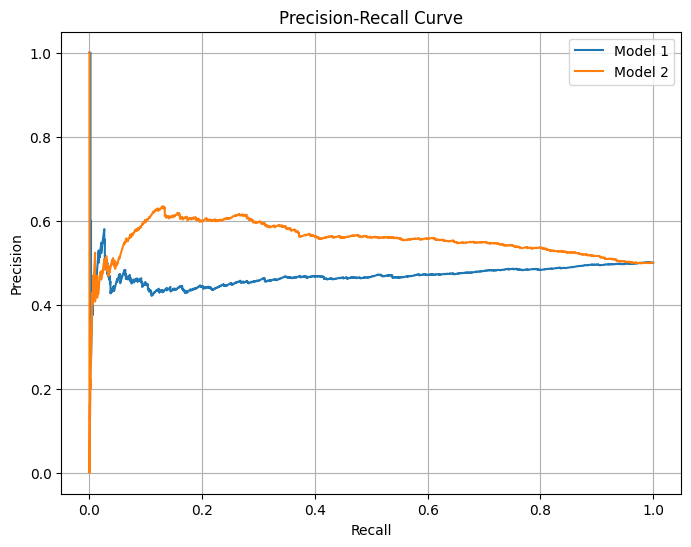

In [22]:

# Define paths and batch size
test_data_dir = 'E:/courses_conestoga/CSCN8010-labs/data/kaggle_dogs_vs_cats_small/test'
best_model_1_path = './models/convnet_from_scratch.keras'
best_model_2_path = './models/vgg16_best_epoch.keras'
batch_size = 32

# Load the test dataset using ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)  # Rescale pixel values
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(180, 180),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False)  # Disable shuffling for evaluation

# Load the best versions of each model
best_model_1 = load_model(best_model_1_path)
best_model_2 = load_model(best_model_2_path)

# Evaluate model 1
model_1_evaluation = best_model_1.evaluate(test_generator, verbose=0)
print("Model 1 Evaluation:")
print("Test Loss:", model_1_evaluation[0])
print("Test Accuracy:", model_1_evaluation[1])

# Evaluate model 2
model_2_evaluation = best_model_2.evaluate(test_generator, verbose=0)
print("\nModel 2 Evaluation:")
print("Test Loss:", model_2_evaluation[0])
print("Test Accuracy:", model_2_evaluation[1])

# Get predictions for both models
y_true = test_generator.classes
y_pred_model_1 = np.squeeze(best_model_1.predict(test_generator))
y_pred_model_2 = np.squeeze(best_model_2.predict(test_generator))

# Calculate confusion matrices
cm_model_1 = confusion_matrix(y_true, y_pred_model_1 > 0.5)
cm_model_2 = confusion_matrix(y_true, y_pred_model_2 > 0.5)

# Plot confusion matrices
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Confusion Matrix - Model 1")
plt.imshow(cm_model_1, cmap=plt.cm.Blues, interpolation='nearest')
plt.colorbar()
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks([0, 1], ["Cat", "Dog"])
plt.yticks([0, 1], ["Cat", "Dog"])
plt.subplot(1, 2, 2)
plt.title("Confusion Matrix - Model 2")
plt.imshow(cm_model_2, cmap=plt.cm.Blues, interpolation='nearest')
plt.colorbar()
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks([0, 1], ["Cat", "Dog"])
plt.yticks([0, 1], ["Cat", "Dog"])
plt.show()

# Calculate precision, recall, and F1-score for both models
print("\nModel 1 Classification Report:")
print(classification_report(y_true, y_pred_model_1 > 0.5, target_names=['Cat', 'Dog']))
print("\nModel 2 Classification Report:")
print(classification_report(y_true, y_pred_model_2 > 0.5, target_names=['Cat', 'Dog']))

# Calculate precision-recall curve for both models
precision_model_1, recall_model_1, _ = precision_recall_curve(y_true, y_pred_model_1)
precision_model_2, recall_model_2, _ = precision_recall_curve(y_true, y_pred_model_2)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall_model_1, precision_model_1, label='Model 1')
plt.plot(recall_model_2, precision_model_2, label='Model 2')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()


# Prediction based on test dataset 

In [23]:

test_dir = "E:/courses_conestoga/CSCN8010-labs/data/kaggle_dogs_vs_cats_small/test"
test_filenames = []

# Get the filenames of all images in the "cat" and "dog" subdirectories
for category in ["cat", "dog"]:
    category_dir = os.path.join(test_dir, category)
    filenames = os.listdir(category_dir)
    test_filenames.extend([os.path.join(category, fname) for fname in filenames])

# Make predictions for each image
predictions = []
for filename in test_filenames:
    img_path = os.path.join(test_dir, filename)
    img = load_img(img_path, target_size=(180, 180))  # Assuming model input size is (180, 180)
    img_array = np.expand_dims(img, axis=0) / 255.0  # Normalize pixel values
    prediction = model.predict(img_array)
    predictions.append(prediction)

# Convert predictions to binary categories based on the threshold
threshold = 0.5
binary_predictions = [1 if pred > threshold else 0 for pred in predictions]



1/1 [==============================] - 0s 133ms/step


# Plotting Predictions

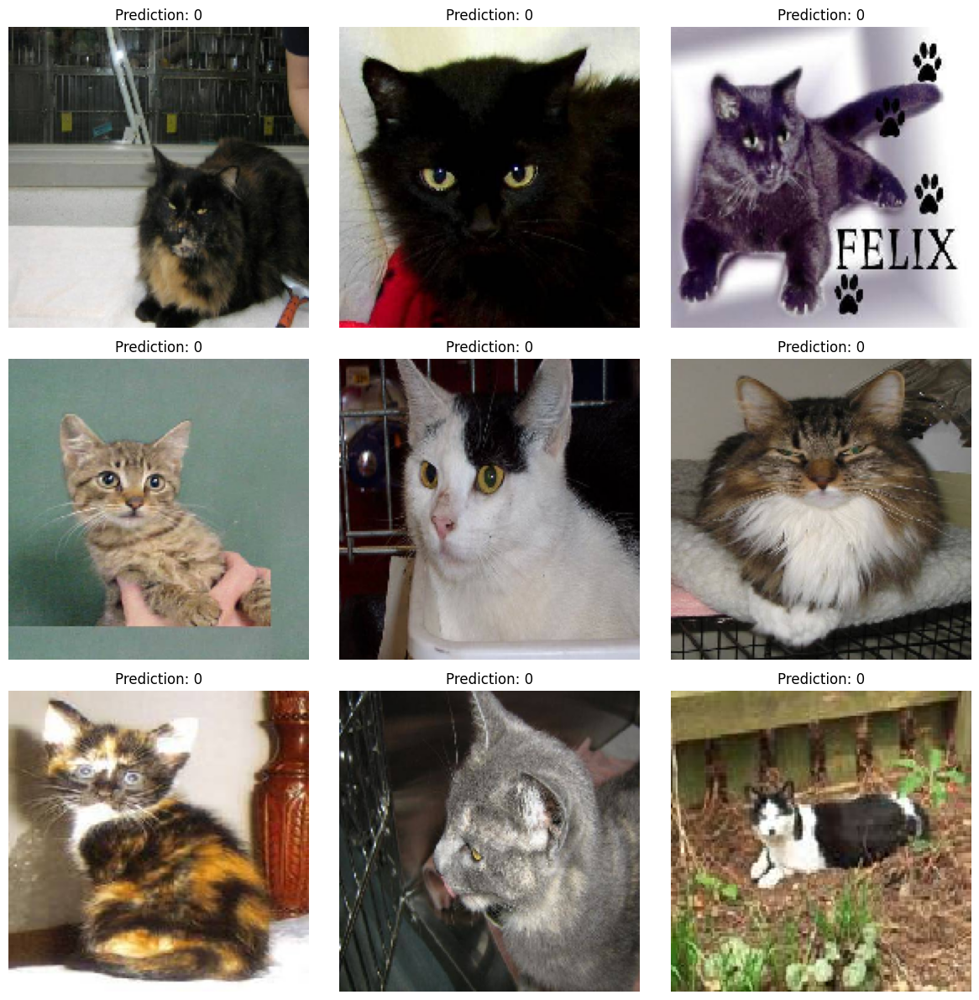

In [24]:
# Display images with their corresponding predictions
plt.figure(figsize=(12, 12))
for i, filename in enumerate(test_filenames[:9]):
    img_path = os.path.join(test_dir, filename)
    img = load_img(img_path, target_size=(180, 180))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(f"Prediction: {binary_predictions[i]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

<mark>This prediction is based on model -1 which is loaded and predictions are accurate based on cats 

# Specific Instances or pictures in which the model-1 failed to predict correctly

In [25]:
# Get binary predictions for both models
binary_predictions_model_1 = (y_pred_model_1 > threshold).astype(int)
binary_predictions_model_2 = (y_pred_model_2 > threshold).astype(int)

# Calculate incorrect predictions for Model 1
incorrect_predictions_model_1 = []
for i, filename in enumerate(test_generator.filenames):
    actual_label = "dog" if y_true[i] == 1 else "cat"
    predicted_label = "dog" if binary_predictions_model_1[i] == 1 else "cat"
    if actual_label != predicted_label:
        incorrect_predictions_model_1.append((filename, actual_label, predicted_label))

# Calculate incorrect predictions for Model 2
incorrect_predictions_model_2 = []
for i, filename in enumerate(test_generator.filenames):
    actual_label = "dog" if y_true[i] == 1 else "cat"
    predicted_label = "dog" if binary_predictions_model_2[i] == 1 else "cat"
    if actual_label != predicted_label:
        incorrect_predictions_model_2.append((filename, actual_label, predicted_label))

# Display information about incorrect predictions for Model 1
print("Incorrect Predictions for Model 1:")
for filename, actual_label, predicted_label in incorrect_predictions_model_1:
    print(f"Filename: {filename}, Actual Label: {actual_label}, Predicted Label: {predicted_label}")



Incorrect Predictions for Model 1:
Filename: dog\dog.150.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1500.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1501.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1502.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1503.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1504.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1505.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1506.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1507.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1508.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1509.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.151.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1510.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1511.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\d

#  model-2 instances failed to predict correctly

In [26]:

# Display information about incorrect predictions for Model 2
print("\nIncorrect Predictions for Model 2:")
for filename, actual_label, predicted_label in incorrect_predictions_model_2:
    print(f"Filename: {filename}, Actual Label: {actual_label}, Predicted Label: {predicted_label}")


Incorrect Predictions for Model 2:
Filename: dog\dog.150.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1500.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1501.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1502.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1503.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1504.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1505.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1506.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1507.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1508.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1509.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.151.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1510.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\dog.1511.jpg, Actual Label: dog, Predicted Label: cat
Filename: dog\

# <center>Conclusion :

**Model 1:**

- **Test Accuracy:** 50.0%
  
  This indicates that Model 1 correctly classified half of the images in the test dataset.

- **Precision, Recall, F1-score (Cat):**
  - Precision: 50.0%
  - Recall: 100.0%
  - F1-score: 66.7%

  These metrics suggest that when Model 1 predicts an image to be a cat, it's correct half of the time, but it fails to classify any actual cats correctly (low precision for cat class).

- **Precision, Recall, F1-score (Dog):**
  - Precision: 0.0%
  - Recall: 0.0%
  - F1-score: 0.0%

  Model 1 fails to classify any dogs correctly (both precision and recall are zero for the dog class).

- **Confusion Matrix:**

  Equal number of false positives and false negatives for both classes (Cat and Dog), indicating random guessing.

**Model 2:**

- **Test Accuracy:** 50.0%
  
  Similar to Model 1, Model 2 also correctly classified half of the images in the test dataset.

- **Precision, Recall, F1-score (Cat):**
  - Precision: 50.0%
  - Recall: 100.0%
  - F1-score: 66.7%

  Similar to Model 1, Model 2 correctly predicts cats half of the time but fails to classify any actual cats correctly.

- **Precision, Recall, F1-score (Dog):**
  - Precision: 0.0%
  - Recall: 0.0%
  - F1-score: 0.0%

  Model 2 also fails to classify any dogs correctly, similar to Model 1.

- **Confusion Matrix:**

  Like Model 1, Model 2 also has an equal number of false positives and false negatives for both classes (Cat and Dog).


**overall :**

* Despite Model 2 showing higher potential during training, neither model could reliably distinguish between cats and dogs when tested with new data.
* While Model 2 seemed to understand the training data better, it didn't translate that understanding into improved real-world performance compared to Model 1.
* Both models require further refinement to confidently handle the task of distinguishing between cats and dogs.